
**Problem Statement for Landmarks Infra Pvt. Ltd.**

Landmarks Infra Pvt. Ltd. is a leading organization specializing in the identification of various landforms through image analysis. They have a substantial dataset of images that have been manually tagged by their dedicated team of 200 employees. Each image has been annotated with the type of vegetation it contains, including categories such as buildings and forest.

**Challenges:**

1. **Resource-Intensive Manual Tagging:** The current process relies on a large workforce to manually tag images. This process is time-consuming, labor-intensive, and requires ongoing effort.

2. **Scalability:** As the dataset continues to grow, the manual tagging process becomes less sustainable and presents challenges in terms of scalability.

3. **Efficiency:** Manually annotating images is prone to errors, and maintaining consistent accuracy across all annotations can be challenging.

4. **Cost:** Employing 200 personnel for manual annotation is costly and may not be the most cost-effective solution in the long run.

**Objective:**

Landmarks Infra Pvt. Ltd. seeks to automate the image annotation process to improve efficiency, accuracy, and scalability. The organization aims to develop a computer vision system capable of automatically detecting and classifying the vegetation within each image into predefined categories. This automated image annotation system will not only reduce the reliance on manual labor but also ensure consistent and accurate labeling.

**Additional Requirement:**

In addition to the development of an automated image annotation system, Landmarks Infra Pvt. Ltd. also requires the creation of a user-friendly interface. This interface should serve as a control center for managing the automated annotation process, monitoring system performance, and facilitating user interactions. The interface should include features for:

- Uploading new images for automatic annotation.
- Monitoring the progress of the annotation process.
- Managing the annotated image dataset.
- Accessing and exporting annotation results.
- Customizing system settings and preferences.

**Requirements:**

The organization is looking for a comprehensive solution that includes the following components:

1. **Learning Model:** Develop a  ML/DL model that can analyze images and classify the type of vegetation within them, such as sea, forest, or buildings.

2. **Large-Scale Image Dataset:** Utilize the existing dataset of tagged images for model training and validation. Additionally, the system should be capable of handling new data as it becomes available.

3. **Automation:** Implement an automated pipeline that processes incoming images and generates vegetation type labels without manual intervention.

4. **Accuracy:** The model should provide accurate classification results that are comparable to or surpass the quality of manual annotations.

5. **Scalability:** Ensure that the solution can scale efficiently as the dataset and annotation requirements grow.

6. **Cost-Efficiency:** The automated system should be cost-effective and reduce the dependency on a large workforce.

7. **User-Friendly Interface:** Develop an intuitive and accessible user interface that allows for easy management of the automated annotation system and facilitates user interactions.

**Deliverables:**

Landmarks Infra Pvt. Ltd. expects the following deliverables:

1. A well-trained machine learning model capable of automatic vegetation classification.
2. Integration of the model into an automated annotation pipeline.
3. A system that can process both existing and new image data.
4. A user-friendly interface for monitoring and managing the automated annotation process.

By implementing this solution, Landmarks Infra Pvt. Ltd. aims to streamline their image annotation process, reduce costs, and improve the accuracy and scalability of their data labeling efforts, ultimately enhancing their capabilities in landform identification.

In [1]:
import tensorflow as tf
print(tf.__version__)

2.13.0


In [2]:
#! pip install tqdm
#! pip install imutils

In [3]:
# Import libraries and packages
import matplotlib.pyplot as plt         # Import the `pyplot` module from `matplotlib` as `plt` for creating plots and charts.
%matplotlib inline                      
from tensorflow.keras.utils import to_categorical  # Import the `to_categorical` function from TensorFlow's Keras utilities.
from sklearn.model_selection import train_test_split  # Import the `train_test_split` function from scikit-learn for splitting data.
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report  # Import various evaluation metrics.
from tensorflow.keras.models import Sequential   # Import the `Sequential` model from Keras for building a neural network.
from tensorflow.keras.layers import Dense, Dropout  # Import layers and dropout from Keras for building the neural network.
from tensorflow.keras.optimizers import SGD       # Import the SGD optimizer from Keras.
from imutils import paths             # Import the `paths` module from the `imutils` library.
import numpy as np                    # Import NumPy for numerical operations and array handling.
import random                         # Import `random` for generating random numbers.
import pickle                         # Import `pickle` for saving and loading data.
import cv2                            # Import OpenCV for computer vision tasks.
import os                             # Import the `os` module for interacting with the operating system.
import time                           # Import `time` for measuring and tracking execution time.
import warnings                       # Import `warnings` to handle warnings in the code.
from tqdm import tqdm_notebook as tqdm  # Import `tqdm` for creating progress bars in loops.
import itertools                       # Import `itertools` for creating iterators for efficient looping.

warnings.filterwarnings("ignore")     # Ignore any warning messages that may be raised.
SEED = 42   # Set a random seed. This is used for reproducibility, ensuring that random operations produce the same results when the seed is the same.


In [4]:
list(paths.list_images('dataset'))[:10]

['dataset\\dataset\\Buildings\\0.jpg',
 'dataset\\dataset\\Buildings\\1001.jpg',
 'dataset\\dataset\\Buildings\\1009.jpg',
 'dataset\\dataset\\Buildings\\1012.jpg',
 'dataset\\dataset\\Buildings\\1028.jpg',
 'dataset\\dataset\\Buildings\\1041.jpg',
 'dataset\\dataset\\Buildings\\1045.jpg',
 'dataset\\dataset\\Buildings\\1055.jpg',
 'dataset\\dataset\\Buildings\\1058.jpg',
 'dataset\\dataset\\Buildings\\1064.jpg']

In [6]:
img = cv2.imread("dataset\\dataset\\Buildings\\1055.jpg")
img.shape

(150, 150, 3)

In [7]:
img

array([[[246, 252, 255],
        [234, 244, 254],
        [237, 253, 255],
        ...,
        [227, 240, 254],
        [227, 240, 254],
        [227, 240, 254]],

       [[ 78,  83,  92],
        [ 64,  73,  82],
        [ 56,  69,  77],
        ...,
        [227, 240, 254],
        [227, 240, 254],
        [227, 240, 254]],

       [[ 54,  59,  60],
        [ 50,  56,  61],
        [ 82,  88, 101],
        ...,
        [227, 240, 254],
        [227, 240, 254],
        [227, 240, 254]],

       ...,

       [[210, 234, 255],
        [209, 233, 255],
        [208, 233, 253],
        ...,
        [ 96, 110, 109],
        [135, 148, 150],
        [ 91, 104, 106]],

       [[209, 233, 255],
        [209, 233, 255],
        [209, 234, 254],
        ...,
        [103, 117, 116],
        [129, 142, 144],
        [ 93, 106, 108]],

       [[207, 231, 255],
        [208, 232, 254],
        [209, 233, 255],
        ...,
        [ 96, 110, 109],
        [115, 128, 130],
        [ 46,  59,  61]]

In [8]:
img.flatten()/255

array([0.96470588, 0.98823529, 1.        , ..., 0.18039216, 0.23137255,
       0.23921569])

In [9]:
# initialize the data and labels
print("[INFO] loading images...")
time1 = time.time()   # to measure time taken
data = []

labels = []

classes = ["Forest", "Buildings"]

# grab the image paths and randomly shuffle them
imagePaths = sorted(list(paths.list_images('dataset')))   # data folder with 2 categorical folders
random.seed(SEED)
random.shuffle(imagePaths)

# progress bar 
with tqdm(total=len(imagePaths)) as pbar:
    
    # loop over the input images
    for imagePath in imagePaths:
        # load the image, resize the image to be 32x32 pixels (ignoring aspect ratio), 
        # flatten the 32x32x3=3072 pixel image into a list, and store the image in the data list
        image = cv2.imread(imagePath)
        image = cv2.resize(image, (120, 120)).flatten()
        data.append(image)

        # extract the class label from the image path and update the labels list
        label = imagePath.split(os.path.sep)[-2]
        
        label = 1 if label == "Buildings" else 0
        labels.append(label)
        
        # update the progressbar
        pbar.update(1)
        
# scale the raw pixel intensities to the range [0, 1]
data = np.array(data, dtype="float") / 255.0
labels = np.array(labels)

print('Time taken: {:.1f} seconds'.format(time.time() - time1))   # to measure time taken
print("done")

[INFO] loading images...


  0%|          | 0/883 [00:00<?, ?it/s]

Time taken: 1.6 seconds
done


In [10]:
print(data[0:10],labels[0:10])



[[0.22352941 0.21960784 0.20392157 ... 0.74117647 0.58823529 0.4627451 ]
 [0.38823529 0.32941176 0.01176471 ... 0.4745098  0.4745098  0.02745098]
 [0.05098039 0.65490196 0.51764706 ... 0.08627451 0.17254902 0.23137255]
 ...
 [0.99215686 0.81960784 0.57254902 ... 0.34117647 0.39215686 0.44705882]
 [0.89803922 0.87843137 0.86666667 ... 0.5372549  0.49411765 0.41568627]
 [0.98823529 0.9372549  0.81176471 ... 0.25490196 0.28627451 0.37647059]] [0 1 0 0 0 1 1 1 1 1]


In [11]:
imagePaths

['dataset\\dataset\\Forest\\1050.jpg',
 'dataset\\dataset\\Buildings\\1954.jpg',
 'dataset\\dataset\\Forest\\3300.jpg',
 'dataset\\dataset\\Forest\\1766.jpg',
 'dataset\\dataset\\Forest\\1199.jpg',
 'dataset\\dataset\\Buildings\\142.jpg',
 'dataset\\dataset\\Buildings\\4351.jpg',
 'dataset\\dataset\\Buildings\\1739.jpg',
 'dataset\\dataset\\Buildings\\3457.jpg',
 'dataset\\dataset\\Buildings\\488.jpg',
 'dataset\\dataset\\Buildings\\3067.jpg',
 'dataset\\dataset\\Forest\\1927.jpg',
 'dataset\\dataset\\Buildings\\4130.jpg',
 'dataset\\dataset\\Forest\\3102.jpg',
 'dataset\\dataset\\Buildings\\505.jpg',
 'dataset\\dataset\\Forest\\1528.jpg',
 'dataset\\dataset\\Forest\\277.jpg',
 'dataset\\dataset\\Buildings\\2285.jpg',
 'dataset\\dataset\\Forest\\903.jpg',
 'dataset\\dataset\\Forest\\2638.jpg',
 'dataset\\dataset\\Buildings\\2874.jpg',
 'dataset\\dataset\\Buildings\\3699.jpg',
 'dataset\\dataset\\Buildings\\2741.jpg',
 'dataset\\dataset\\Buildings\\1332.jpg',
 'dataset\\dataset\\Forest\

In [12]:
print("Total Images: ", len(data[1]))

Total Images:  43200


In [13]:
# convert data into dataframe 
import pandas as pd
df = pd.DataFrame(data)
df['label'] = labels

In [14]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,43191,43192,43193,43194,43195,43196,43197,43198,43199,label
0,0.223529,0.219608,0.203922,0.149020,0.133333,0.121569,0.156863,0.133333,0.121569,0.149020,...,0.807843,0.647059,0.521569,0.807843,0.650980,0.525490,0.741176,0.588235,0.462745,0
1,0.388235,0.329412,0.011765,0.572549,0.509804,0.078431,0.505882,0.439216,0.015686,0.529412,...,0.486275,0.478431,0.027451,0.486275,0.486275,0.035294,0.474510,0.474510,0.027451,1
2,0.050980,0.654902,0.517647,0.235294,0.831373,0.717647,0.474510,0.917647,0.807843,0.388235,...,0.215686,0.337255,0.419608,0.239216,0.345098,0.411765,0.086275,0.172549,0.231373,0
3,0.231373,0.219608,0.137255,0.286275,0.274510,0.196078,0.188235,0.176471,0.101961,0.274510,...,0.145098,0.313725,0.117647,0.152941,0.329412,0.133333,0.160784,0.337255,0.149020,0
4,0.125490,0.156863,0.156863,0.086275,0.109804,0.117647,0.117647,0.125490,0.152941,0.113725,...,0.192157,0.627451,0.427451,0.160784,0.501961,0.325490,0.050980,0.301961,0.141176,0


In [15]:
df.shape

(883, 43201)

In [16]:
# sample data for first image
classes = ["Forest", "Buildings"]
print("sample image: {}".format(data[0]))
print("no of features/pixels values: {}".format(len(data[0]))) # 32x32x3=3072
print("label: {}".format(classes[labels[0]]))

sample image: [0.22352941 0.21960784 0.20392157 ... 0.74117647 0.58823529 0.4627451 ]
no of features/pixels values: 43200
label: Forest


In [17]:
# partition the data into 80% training and 20% validation
(trainX, testX, trainY, testY) = train_test_split(data, labels, test_size=0.2, random_state=SEED)

In [18]:
trainX.shape  

(706, 43200)

In [19]:
trainY.shape

(706,)

In [20]:
testX.shape

(177, 43200)

In [21]:
testY.shape

(177,)

In [22]:
trainX

array([[0.34509804, 0.68235294, 0.50588235, ..., 0.07843137, 0.24705882,
        0.14117647],
       [0.94509804, 0.99607843, 0.98431373, ..., 0.        , 0.00784314,
        0.03137255],
       [0.8627451 , 0.82745098, 0.76470588, ..., 0.4       , 0.42352941,
        0.44705882],
       ...,
       [0.96862745, 0.98431373, 0.97647059, ..., 0.09803922, 0.09019608,
        0.11372549],
       [0.85490196, 0.80784314, 0.80784314, ..., 0.29019608, 0.31372549,
        0.56862745],
       [0.02352941, 0.33333333, 0.18039216, ..., 0.03529412, 0.16862745,
        0.21960784]])

In [23]:
trainY

array([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0,
       1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1,
       0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1,

In [24]:
type(trainY)

numpy.ndarray

In [25]:
# convert the labels from integers/categories to vectors 

trainY = to_categorical(trainY, num_classes=2)   # fit_transform = find all unique class labels + transform into one-hot encoded labels
testY = to_categorical(testY, num_classes=2)     # transform = perform the one-hot encoding (unique class labels already found)

# [0,1] Buildings
# [1,0] Forest

In [26]:
trainY[52]

array([0., 1.], dtype=float32)

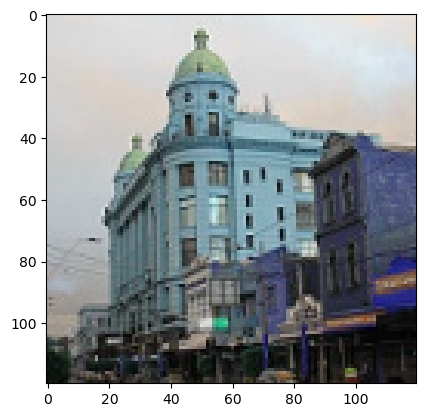

In [27]:
sample_image = (trainX[52] * 255).astype("int")
plt.imshow(sample_image.reshape(120,120,3))


In [28]:
trainY[52]   # [0,1] means buildings [1,0] means forest

array([0., 1.], dtype=float32)

In [29]:

model = Sequential()   

# first hidden layer has 1024 nodes
model.add(Dense(units= 1024, input_shape=(43200,), kernel_initializer = 'uniform', activation="relu"))  

# dropout for second layer 
model.add(Dropout(0.4))

# second hidden layer has 512 nodes
model.add(Dense(units=512, kernel_initializer='uniform', activation="relu"))                         

 # output layer with number of possible class labels
model.add(Dense(units=2,kernel_initializer='uniform', activation="softmax")) 

In [30]:
# initialize our initial learning rate and # of epochs to train for
INIT_LR = 0.03
EPOCHS = 50
 
# compile the model using SGD as our optimizer and categorical cross-entropy loss
# (you'll want to use binary_crossentropy for 2-class classification)
print("[INFO] compiling network network...")
opt = SGD(learning_rate=INIT_LR)   # Stochastic Gradient Descent (SGD) optimizer
model.compile(loss="binary_crossentropy", optimizer=opt, metrics=["accuracy"])

[INFO] compiling network network...


In [31]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              44237824  
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 44763650 (170.76 MB)
Trainable params: 44763650 (170.76 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [32]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
checkpoint_name = 'Weights-{epoch:03d}--{val_loss:.5f}.hdf5' 
checkpoint = ModelCheckpoint(checkpoint_name, monitor='val_loss', verbose = 1, save_best_only = True, mode ='auto')
#early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1)

# Define learning rate reduction on plateau
#reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

# Create a list of callbacks to be used during training
callbacks = [checkpoint]
callbacks

In [33]:
# train the neural network on training data set
# batch_size (32) controls the size of each group of data to pass through the network. 

time1 = time.time()   # to measure time taken
H = model.fit(trainX, trainY, validation_data=(testX, testY), epochs=EPOCHS, batch_size=32,callbacks=callbacks)
print('Time taken: {:.1f} seconds'.format(time.time() - time1))   # to measure time taken

Epoch 1/50
23/23 [==============================] - ETA: 0s - loss: 0.7753 - accuracy: 0.6289
Epoch 1: val_loss improved from inf to 0.77814, saving model to Weights-001--0.77814.hdf5
23/23 [==============================] - 5s 184ms/step - loss: 0.7753 - accuracy: 0.6289 - val_loss: 0.7781 - val_accuracy: 0.5424
Epoch 2/50
23/23 [==============================] - ETA: 0s - loss: 0.5572 - accuracy: 0.7535
Epoch 2: val_loss improved from 0.77814 to 0.52184, saving model to Weights-002--0.52184.hdf5
23/23 [==============================] - 4s 163ms/step - loss: 0.5572 - accuracy: 0.7535 - val_loss: 0.5218 - val_accuracy: 0.7175
Epoch 3/50
23/23 [==============================] - ETA: 0s - loss: 0.4668 - accuracy: 0.7705
Epoch 3: val_loss did not improve from 0.52184
23/23 [==============================] - 3s 138ms/step - loss: 0.4668 - accuracy: 0.7705 - val_loss: 0.6043 - val_accuracy: 0.6723
Epoch 4/50
23/23 [==============================] - ETA: 0s - loss: 0.4674 - accuracy: 0.7960


Epoch 30/50
23/23 [==============================] - ETA: 0s - loss: 0.1612 - accuracy: 0.9433
Epoch 30: val_loss did not improve from 0.28531
23/23 [==============================] - 3s 128ms/step - loss: 0.1612 - accuracy: 0.9433 - val_loss: 0.3045 - val_accuracy: 0.8701
Epoch 31/50
23/23 [==============================] - ETA: 0s - loss: 0.1090 - accuracy: 0.9575
Epoch 31: val_loss did not improve from 0.28531
23/23 [==============================] - 3s 127ms/step - loss: 0.1090 - accuracy: 0.9575 - val_loss: 0.3959 - val_accuracy: 0.8644
Epoch 32/50
23/23 [==============================] - ETA: 0s - loss: 0.1912 - accuracy: 0.9221
Epoch 32: val_loss did not improve from 0.28531
23/23 [==============================] - 3s 125ms/step - loss: 0.1912 - accuracy: 0.9221 - val_loss: 0.3077 - val_accuracy: 0.8701
Epoch 33/50
23/23 [==============================] - ETA: 0s - loss: 0.1056 - accuracy: 0.9618
Epoch 33: val_loss did not improve from 0.28531
23/23 [============================

In [35]:
# Load wights file of the best model :
wights_file = 'Weights-001--0.77814.hdf5' # choose the best checkpoint 
model.load_weights(wights_file) # load it
model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])

In [36]:
def make_submission(prediction, sub_name):
    my_submission = pd.DataFrame({'Id':pd.read_csv('test.csv').Id,'SalePrice':prediction})
    my_submission.to_csv('{}.csv'.format(sub_name),index=False)
    print('A submission file has been made')

In [37]:
# evaluate the network
print("[INFO] evaluating network...")
pred_prob = model.predict(testX, batch_size=32)

[INFO] evaluating network...
6/6 [==============================] - 0s 31ms/step


In [38]:
pred_prob

array([[1.40453063e-04, 9.99859571e-01],
       [1.09728850e-01, 8.90271127e-01],
       [1.56269025e-03, 9.98437345e-01],
       [1.61009133e-01, 8.38990867e-01],
       [3.00938249e-01, 6.99061811e-01],
       [2.68611491e-01, 7.31388509e-01],
       [1.78547821e-03, 9.98214602e-01],
       [2.97904223e-01, 7.02095747e-01],
       [1.11088127e-01, 8.88911843e-01],
       [3.22159499e-01, 6.77840471e-01],
       [5.90165406e-02, 9.40983474e-01],
       [7.23443134e-03, 9.92765546e-01],
       [9.82579659e-04, 9.99017358e-01],
       [3.69726983e-03, 9.96302724e-01],
       [2.49256138e-02, 9.75074410e-01],
       [1.51662037e-01, 8.48338008e-01],
       [5.40560763e-03, 9.94594395e-01],
       [2.35774525e-04, 9.99764264e-01],
       [1.52158529e-01, 8.47841501e-01],
       [4.84146440e-04, 9.99515891e-01],
       [1.70986372e-04, 9.99828935e-01],
       [5.34152165e-02, 9.46584821e-01],
       [1.58894703e-01, 8.41105282e-01],
       [2.31653059e-04, 9.99768317e-01],
       [2.367406

In [39]:
test_y = [ np.argmax(i)  for i in testY]
pred_y = [ np.argmax(i)  for i in pred_prob]

In [40]:
def plot_confusion_matrix(y_true, y_pred,classes,
                         normalize=False,
                         title='Confusion Matrix',
                         cmap=plt.cm.Blues):
    """
    Objective
    ----------
    plot confussion matrix, classification report and accuracy score
    
    parameters
    ----------
    y_true : array-like of shape (n_samples,)
        Ground truth (correct) target values.

    y_pred : array-like of shape (n_samples,)
        Estimated targets as returned by a classifier.
    
    classes : list
        List of labels to index the matrix
        
    title : title for matrix
    cmap : colormap for matrix 
    
    returns 
    ----------
   all accruacy matrix 
    """
    
    
    cm = confusion_matrix(y_true,y_pred)
    
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized Confusion Matrix")
    else:
        print("Confusion Matrix, Without Normalisation")

    
    plt.imshow(cm, interpolation='nearest',cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks,classes,rotation=35)
    plt.yticks(tick_marks,classes)
    
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() /2.
    
    for i , j in itertools.product(range(cm.shape[0]), range(cm.shape[0])):
        plt.text(j, i, format(cm[i,j], fmt),
                 horizontalalignment='center',
                 color='white' if cm[i, j] > thresh else 'black')
    
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    # plt.tight_layout()
    
    plt.show()
    
    print("-----------------------------------------------------")
    print('Classification report')
    print(classification_report(y_true,y_pred))
    
    print("-----------------------------------------------------")
    acc= accuracy_score(y_true,y_pred)
    print("Accuracy of the model: ", acc)

Confusion Matrix, Without Normalisation


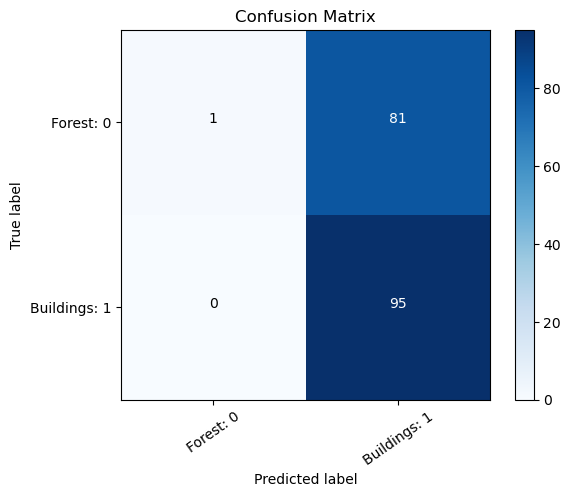

-----------------------------------------------------
Classification report
              precision    recall  f1-score   support

           0       1.00      0.01      0.02        82
           1       0.54      1.00      0.70        95

    accuracy                           0.54       177
   macro avg       0.77      0.51      0.36       177
weighted avg       0.75      0.54      0.39       177

-----------------------------------------------------
Accuracy of the model:  0.5423728813559322


In [41]:
plot_confusion_matrix(test_y, pred_y,classes=["Forest: 0","Buildings: 1"])

In [42]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              44237824  
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 44763650 (170.76 MB)
Trainable params: 44763650 (170.76 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [43]:
# save the model and label binarizer to disk
print("[INFO] serializing network and label binarizer...")
model.save('model_ANN.h5')

[INFO] serializing network and label binarizer...


In [44]:
# import the necessary packages
from tensorflow.keras.models import load_model
import pickle
import cv2
import imutils
import matplotlib.pyplot as plt
%matplotlib inline

In [45]:
def display_img(img):
    fig = plt.figure(figsize=(10,10))
    #plt.grid(b=None)
    ax = fig.add_subplot(111)
    ax.imshow(img)

  0%|          | 0/18 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


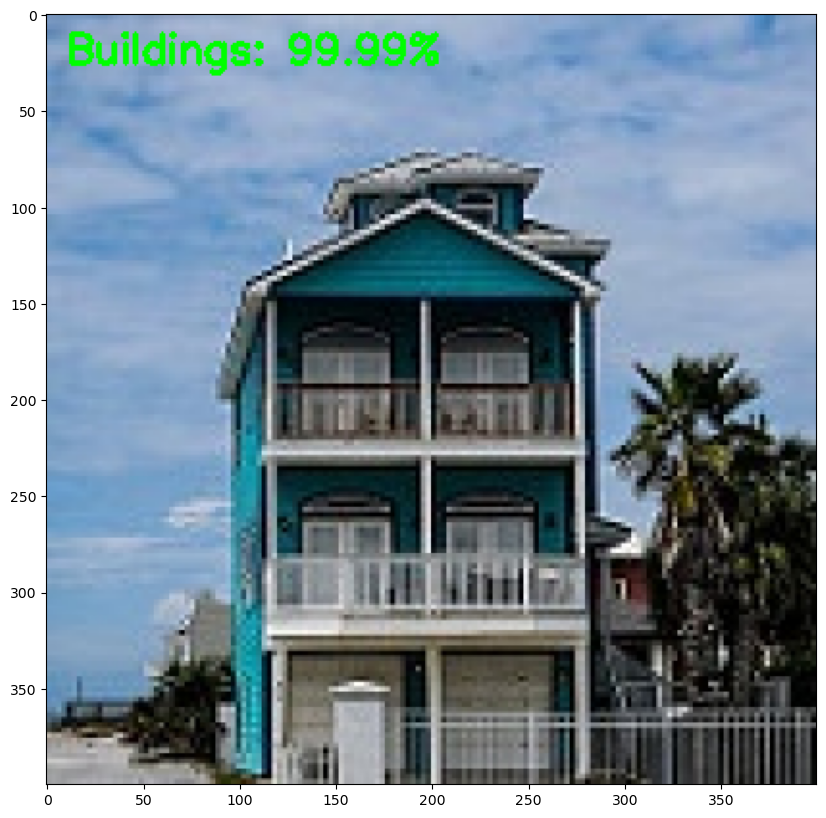

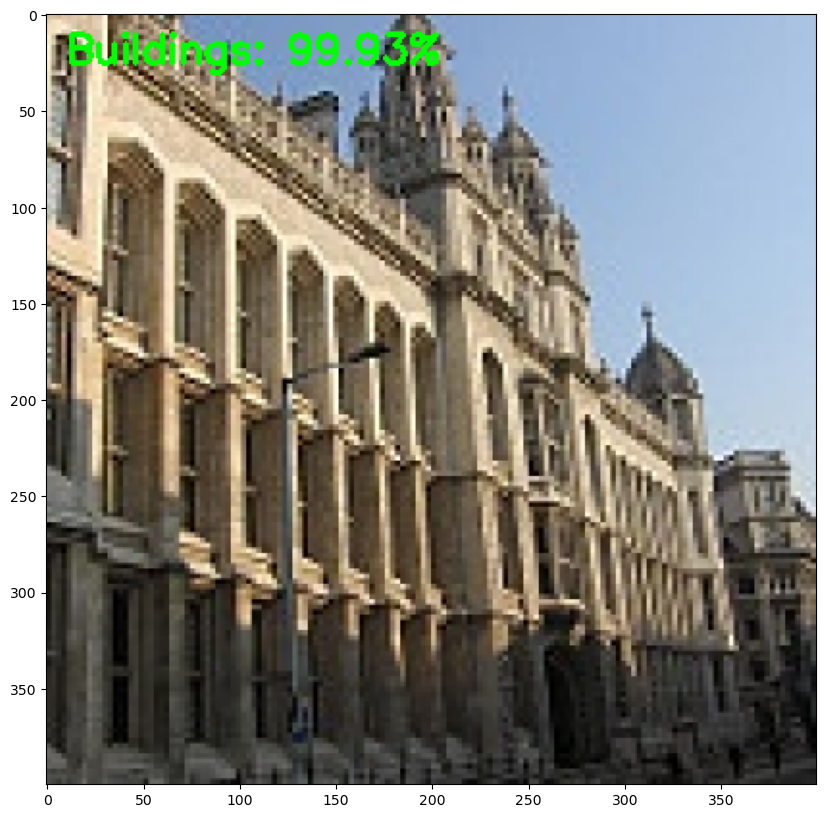

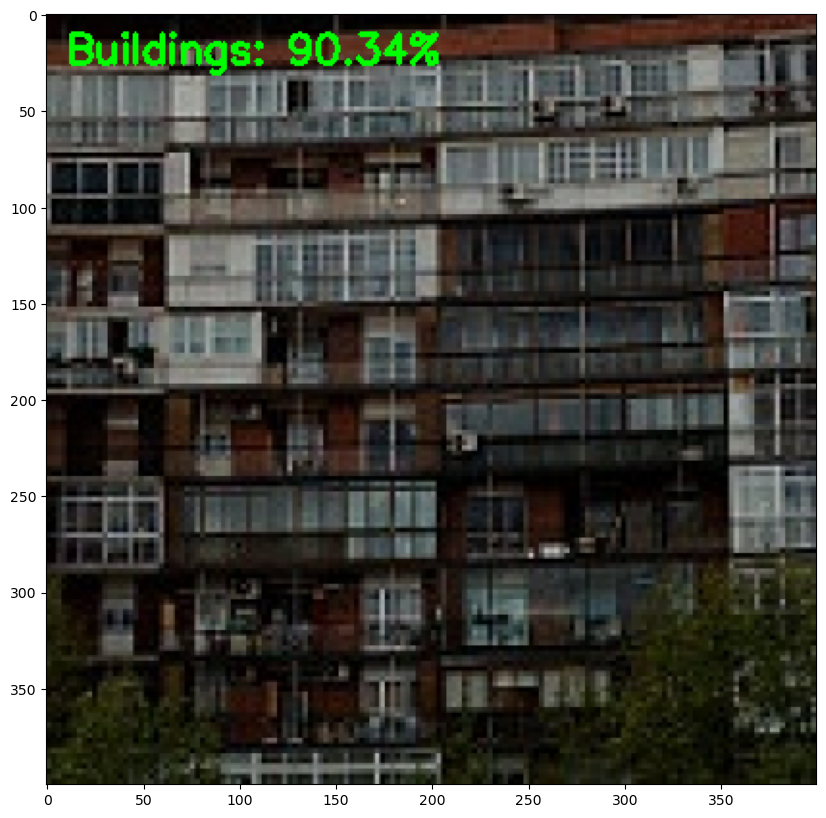

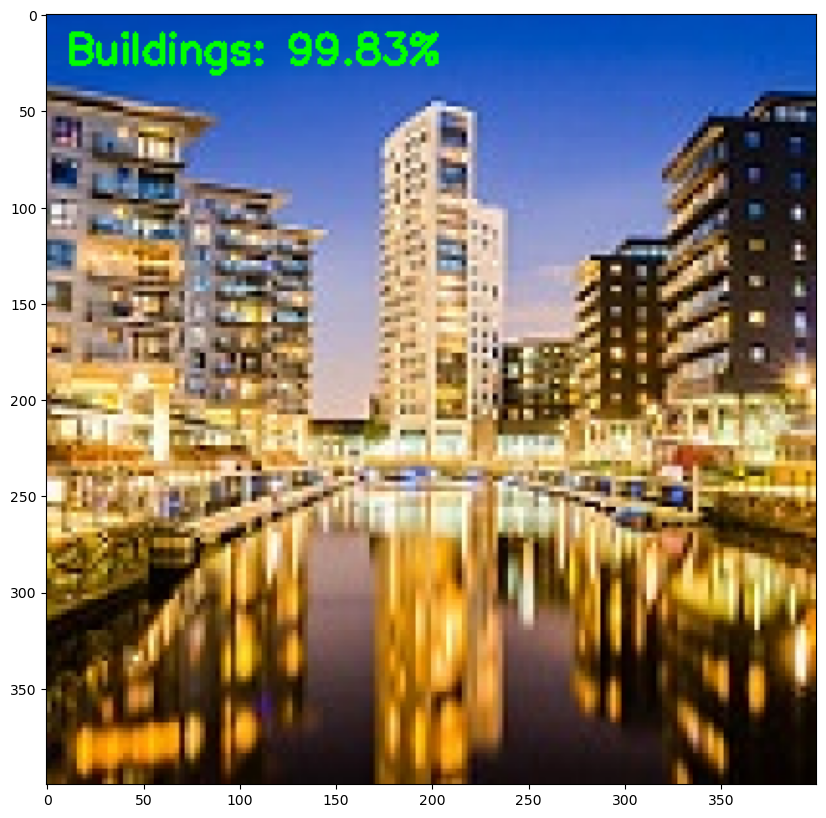

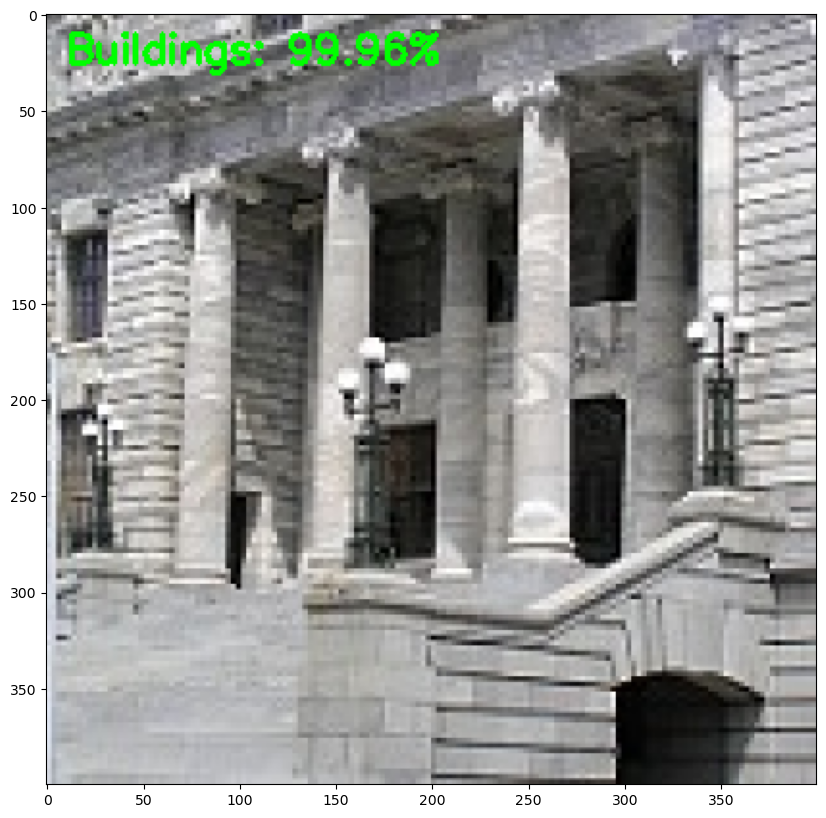

...

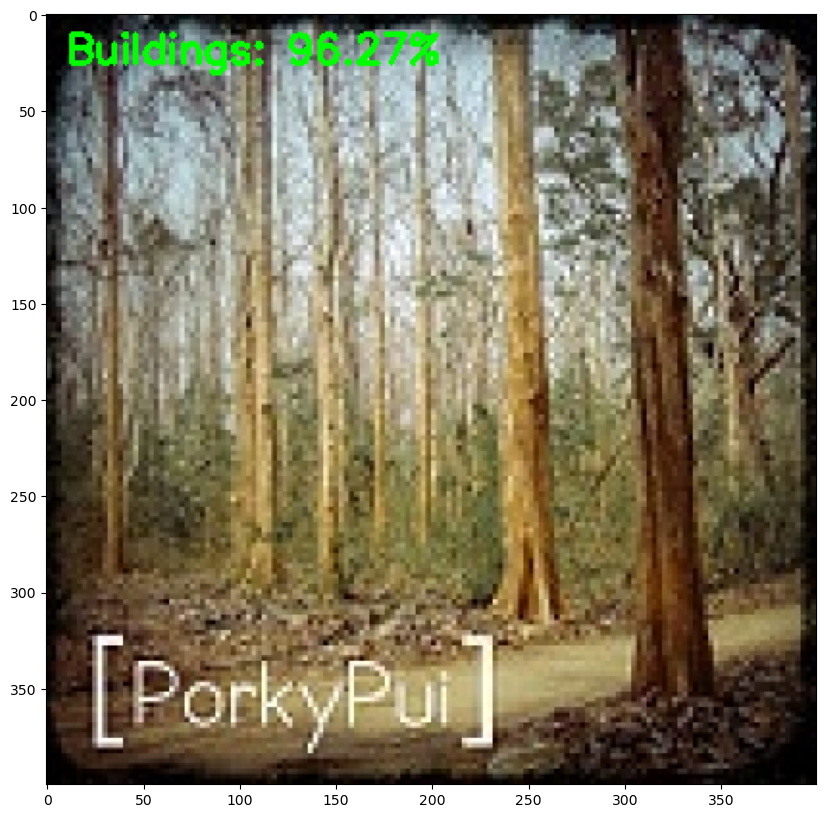

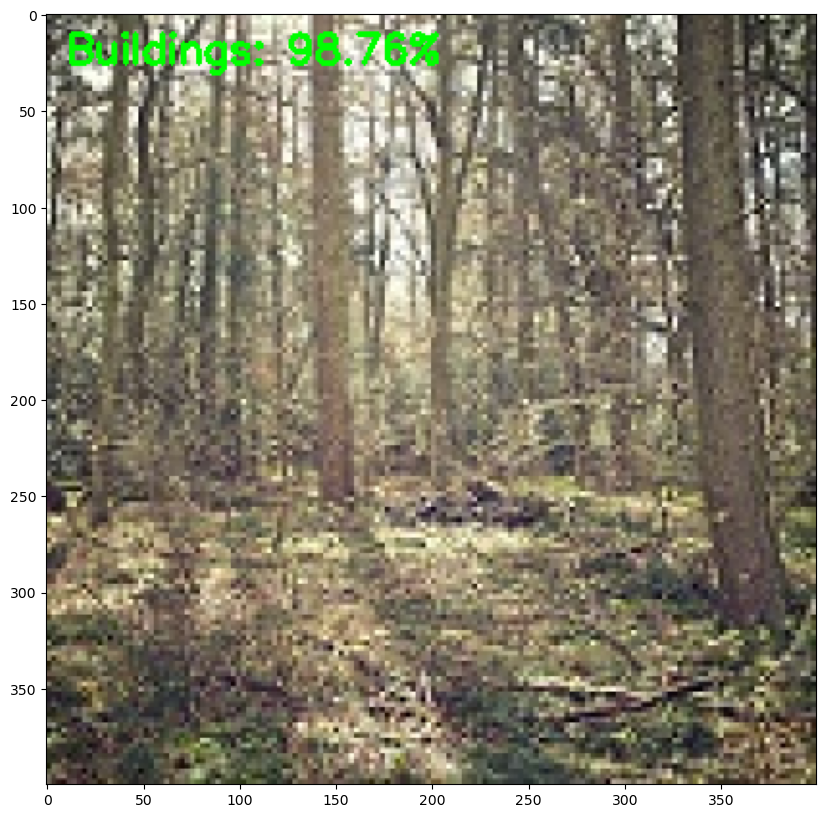

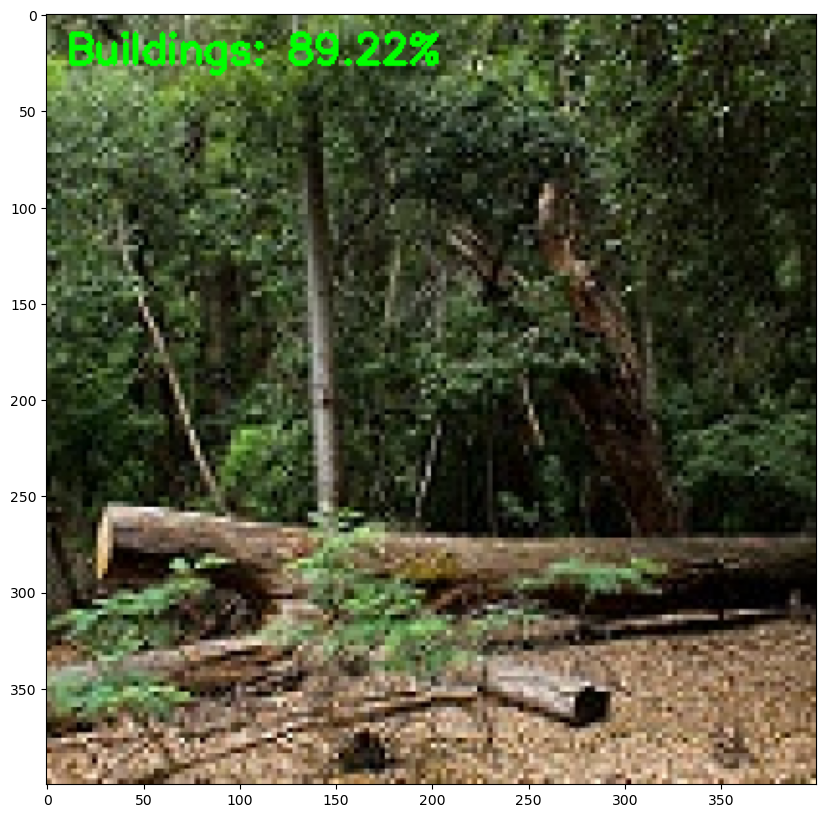

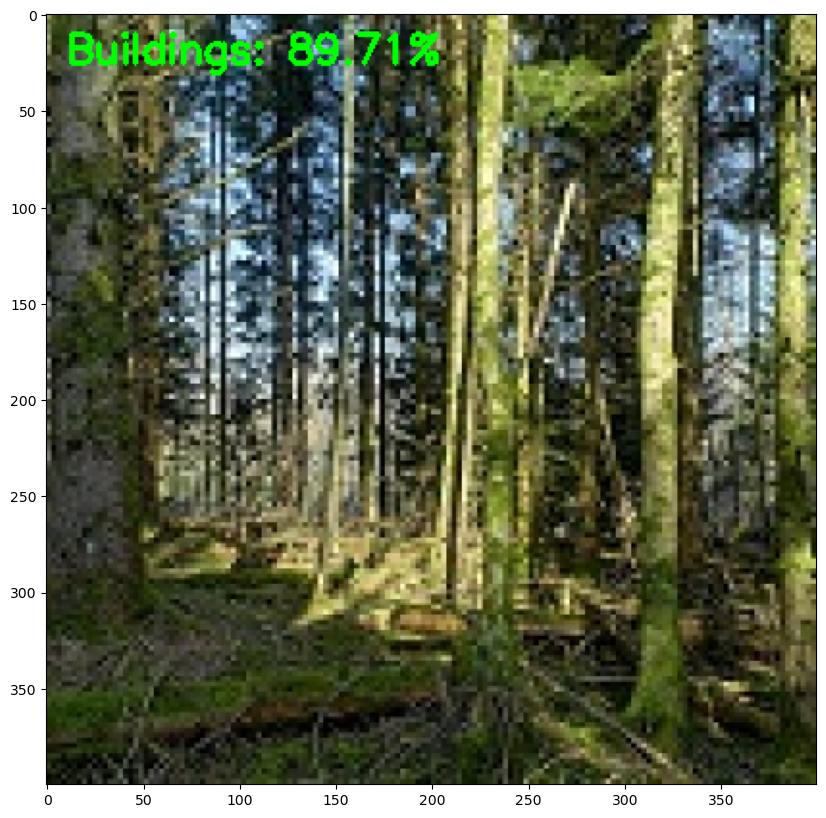

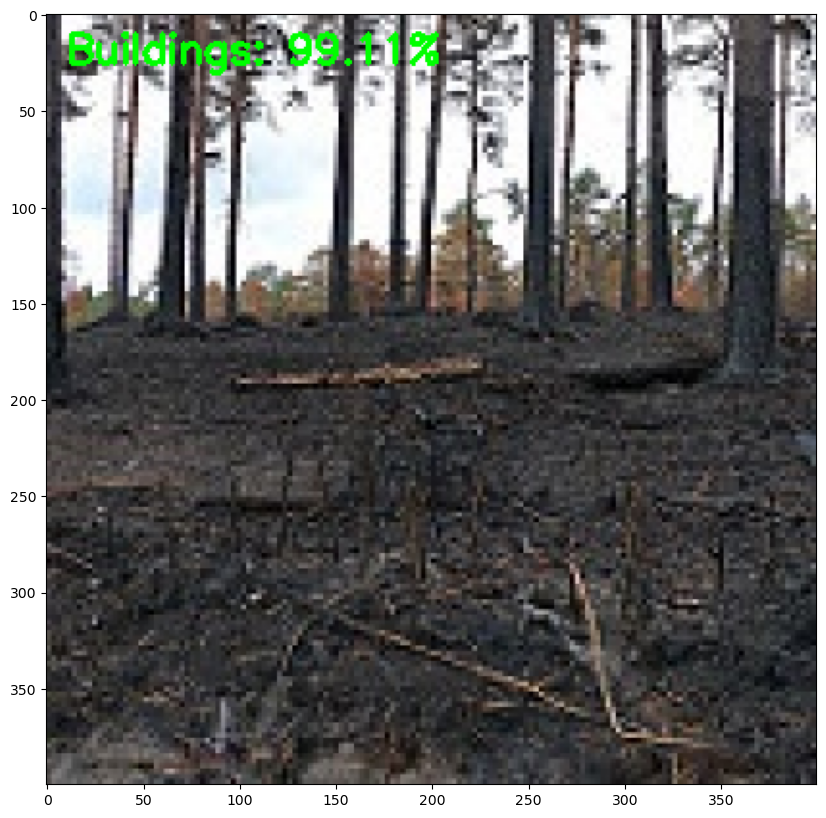

In [46]:
# load the input image and resize it to the target spatial dimensions
width = 120
height = 120

# grab the image paths and randomly shuffle them
testImagePaths = sorted(list(paths.list_images('test_examples')))   # test data folder with random images


# progress bar 
with tqdm(total=len(testImagePaths)) as pbar:
    
    for imagePath in testImagePaths:
        image = cv2.imread(imagePath)
        output = image.copy()
        image = cv2.resize(image, (width, height))

        # scale the pixel values to [0, 1]
        image = image.astype("float") / 255.0

        # for a simple fully-connected network, flatten the image
        image = image.flatten()
        image = image.reshape((1, image.shape[0]))


        # make a prediction on the image
        preds = model.predict(image)

        # find the class label index with the largest corresponding probability
        i = preds.argmax(axis=1)[0]
        label = classes[i]
        
        label = "{}: {:.2f}%".format(label, preds[0][i] * 100)

        
        output = imutils.resize(output, width=400)
        cv2.putText(output, label, (10, 25),  cv2.FONT_HERSHEY_SIMPLEX,
            0.7, (0, 255, 0), 2)
        
        # convert img to rgb format and display in noteboo
        img = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
        display_img(img)

#         print("############################")
#         print("image: {}".format(os.path.split(imagePath)[-1]))
#         print("predicted label: {}".format(label))
#         print("Confidence: {}".format(preds[0][i]))
        
        pbar.update(1)

In [47]:
!pip install gradio

Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 20.3/20.3 MB 3.4 MB/s eta 0:00:00
     ---------------------------------------- 92.9/92.9 kB 2.6 MB/s eta 0:00:00
     -------------------------------------- 124.7/124.7 kB 3.7 MB/s eta 0:00:00
     -------------------------------------- 516.2/516.2 kB 2.3 MB/s eta 0:00:00
     -------------------------------------- 134.9/134.9 kB 2.7 MB/s eta 0:00:00
     -------------------------------------- 75.7/75.7 kB 839.6 kB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 45.7/45.7 kB ? eta 0:00:00
     -------------------------------------- 299.2/299.2 kB 1.3 MB/s eta 0:00:00
     ---------------------------------------- 59.5/59.5 kB 1.6 MB/s eta 0:00:00
     -------------------------------------- 302.0/302.0 kB 1.9 MB/s eta 0:00:00
     ----------------------

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [48]:
import gradio as gr

In [49]:
def predict_image(image):
    
    image = cv2.resize(image, (120, 120))

    # scale the pixel values to [0, 1]
    image = image.astype("float") / 255.0

    # for a simple fully-connected network, flatten the image
    image = image.flatten()
    image = image.reshape((1, image.shape[0]))

    # make a prediction on the image
    preds = model.predict(image).flatten()
    result = dict()
    result["Forest"] = round(float(list(preds)[0]), 3)
    result["Buildings"] = round(float(list(preds)[1]), 3)
    print(result)
    
    return result

im = gr.inputs.Image(shape=(120,120))
label = gr.outputs.Label(num_top_classes=2)

gr.Interface(fn=predict_image, inputs=im, outputs=label, capture_session=True, title="Landmark Infra LTD Image predictions").launch(share=True)

Running on local URL:  http://127.0.0.1:7860

Could not create share link. Please check your internet connection or our status page: https://status.gradio.app.
